In [1]:
# importing necessary libraries for plotting and reading files
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams

tqdm.pandas()

In [2]:
# Since the csv file is very large in size, to save memory we are only reading the columns which might be necessary for our analysis
df = pd.read_csv('./data/metadata.csv', usecols = ['source_x', 'title', 'abstract', 'journal'], low_memory = True)
df.head()

,source_x,title,abstract,journal
0,PMC,Clinical features of culture-proven Mycoplasma...,OBJECTIVE: This retrospective chart review des...,BMC Infect Dis
1,PMC,Nitric oxide: a pro-inflammatory mediator in l...,Inflammatory diseases of the respiratory tract...,Respir Res
2,PMC,Surfactant protein-D and pulmonary host defense,Surfactant protein-D (SP-D) participates in th...,Respir Res
3,PMC,Role of endothelin-1 in lung disease,Endothelin-1 (ET-1) is a 21 amino acid peptide...,Respir Res
4,PMC,Gene expression in epithelial cells in respons...,Respiratory syncytial virus (RSV) and pneumoni...,Respir Res


### Finding the most frequent journals in the dataset

In [3]:
# As instructed, the first source is selected as the source for the papers which have multiple sources mentioned
df['source'] = df['source_x'].apply(lambda x: x.split(';')[0])
df.head()

,source_x,title,abstract,journal,source
0,PMC,Clinical features of culture-proven Mycoplasma...,OBJECTIVE: This retrospective chart review des...,BMC Infect Dis,PMC
1,PMC,Nitric oxide: a pro-inflammatory mediator in l...,Inflammatory diseases of the respiratory tract...,Respir Res,PMC
2,PMC,Surfactant protein-D and pulmonary host defense,Surfactant protein-D (SP-D) participates in th...,Respir Res,PMC
3,PMC,Role of endothelin-1 in lung disease,Endothelin-1 (ET-1) is a 21 amino acid peptide...,Respir Res,PMC
4,PMC,Gene expression in epithelial cells in respons...,Respiratory syncytial virus (RSV) and pneumoni...,Respir Res,PMC


In [4]:
# Finding the top 10 most frequent journals
most_frequent_journals = df['journal'].value_counts()[:10].index
most_frequent_journals

Index(['PLoS One', 'bioRxiv', 'BMJ', 'Sci Rep',
       'Int J Environ Res Public Health', 'Nature', 'Lancet',
       'Int. j. environ. res. public health (Online)', 'Cureus', 'Viruses'],
      dtype='object')

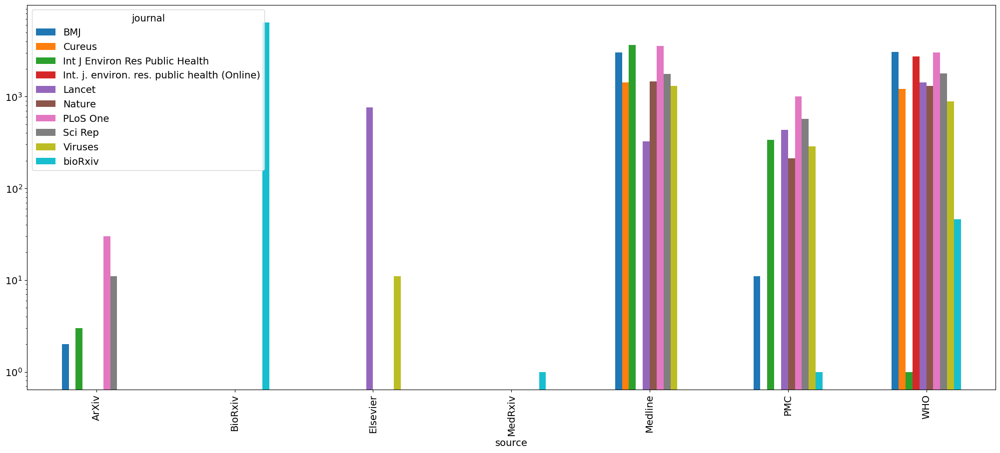

In [5]:
# Plotting distribution of papers across the top 10 most frequent journals. Y-axis is log scaled for better visualization.
plot_df = df[df['journal'].isin(most_frequent_journals)]
results = pd.crosstab(plot_df['source'], plot_df['journal'])

plt.rcParams.update({'font.size': 14})
rcParams['figure.figsize'] = 25, 10
results.plot.bar(logy=True)
plt.show()

The chart above is generated by using the crosstab method of pandas. Crosstab is a simple cross tabulation of two (or more) factors. Here the two factors are source and journal. The X-axis contains the name of various sources and each source can have multiple journals. Each of the journal is signified by a color which can be understood by looking at the color legend in the figure. From the chart, we can deduce that WHO is the highest source of producing journals with WHO contributing a wide range of journals. PMC and Mediline aren't far behind. MedRxiv seems to publish the least amount of journals.

### Clustering and Visualizing the data using text from the abstract sections

In [6]:
# import libraries and modules for visualizations, clustering and text preprocessing
import re
import string
from langdetect import detect
from scipy.spatial.distance import cdist

import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer

punctuations = string.punctuation
stopwords = list(stopwords.words('english'))
lmtzr = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to /home/bikram/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [7]:
# Removing all rows which have null values
plot_df = df[df['abstract'].notna()]
plot_df.dropna(inplace=True)

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


Due to memory restrictions of the system we are working on, we will limit our study to taking 10000 documents which are randomly sampled from our dataset.

In [8]:
# Sampling 10000 random rows due to memory limitation in system.
plot_df = plot_df.sample(10000, random_state=2020)

In [9]:
# To the stop words list, we add a few more stop words of our own which occur too frequently in almost all the papers
custom_stop_words = [
    'cell', 'virus', 'infection', 'study', 'using', 'disease', 'article', 'doi','used', 'may', 'also', 'based',
    'covid', 'conclusion', 'result', 'however', 'yet', 'pandemic', 'cov', 'health', 'method', 'patient', 'patients'
]

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)
        
        
# Function to detect language of a text        
def detect_language(text):
    try:
        lang = detect(text)
        return lang
    except:
        return 'unk'

We will restrict our study to only those papers written in english. Mixing up papers of different languages might lead to unexpected results. Hence we will filter out all papers whose language is not english. Besides this, we will apply some text preprocessing to all the abstract texts of the papers. This will help us filter out unncessary and unimportant words or terms that might affect the quality of results.

In [10]:
# Detecing language of each abstract text and filtering all rows with language other than english
plot_df['language'] = plot_df['abstract'].progress_apply(lambda x: detect_language(x))
plot_df = plot_df[plot_df['language'] == 'en']

# Except for alphanumeric terms, filtering out all other terms
plot_df['tokenized_col'] = plot_df.progress_apply(lambda row: (re.sub("[^A-Za-z0-9' ]+", ' ', row['abstract'])),axis=1)

# Filtering out purely numeric terms as they don't help much in our analysis and can lead to unexpected behaviour
plot_df['tokenized_col'] = plot_df.progress_apply(lambda row: (re.sub("^\d+\s|\s\d+\s|\s\d+$", ' ', row['tokenized_col'])),axis=1)

# Lowercasing all the abstract texts
plot_df['tokenized_col'] = plot_df.progress_apply(lambda row: row['tokenized_col'].lower(), axis = 1)

# Tokenizing each of the abstract texts into separate terms
plot_df['tokenized_col'] = plot_df.progress_apply(lambda row: (word_tokenize(row['tokenized_col'])), axis = 1)

# Lemmatizing each word to convert all words to its root word wherever possible
plot_df['tokenized_col'] = plot_df.progress_apply(lambda row: ([lmtzr.lemmatize(w) for w in row['tokenized_col']]), axis=1)

# Filtering out all stopwords and also those terms with length less than 3
plot_df['tokenized_col'] = plot_df.progress_apply(lambda row: ([w for w in row['tokenized_col'] if w not in stopwords and len(w) >= 3]), axis=1)

# Joining all the separated tokens together into a different column for future use
plot_df['col'] = plot_df.progress_apply(lambda row: ' '.join(row['tokenized_col']), axis=1)

100%|██████████| 9840/9840 [00:00<00:00, 82014.58it/s]


In [11]:
# We will vectorize the abstract texts using Tfidf vectorizer. The max_features (or vector dimension) 
# is kept at 5000 to account for memory limiation issues.
text = plot_df['col'].values
max_features = 5000

tfidf_vectorizer = TfidfVectorizer(max_features=max_features)
X = tfidf_vectorizer.fit_transform(text)

X.shape

(9840, 5000)

In [22]:
# Using PCA, we will reduce the dimensions of the vectors. This will make clustering of the texts by the k-means
# algorithm more memory efficient
pca = PCA(n_components=0.95, random_state=42, copy=False)
X_reduced = pca.fit_transform(X.toarray())
X_reduced.shape

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(9840, 3221)

We can see here that the dimension of the vectors got reduced from 5000 to 3215 after we apply Principal Component Analysis (PCA) on it. 

Next we will apply clustering on the vectorized data. For this, we will use the K-means algorithm. The K-means algorithm requires the number of clusters(k) to be generated as an user input. So, to find the optimal number of clusters, we will use the elbow method. In the Elbow method, we are actually varying the number of clusters ( K ) from 10 – 25. For each value of K, we are calculating the WCSS ( Within-Cluster Sum of Square ). WCSS is the sum of squared distance between each point and the centroid in a cluster. When we plot the WCSS with the K value, the plot looks like an Elbow. As the number of clusters increases, the WCSS value will start to decrease. WCSS value is largest when K = 1. When we analyze the graph we can see that the graph will rapidly change at a point and thus creating an elbow shape. The value of K where the elbow shape is generated can be considered as an optimal value for k to be used in K-means.

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 15/15 [10:38<00:00, 42.58s/it]


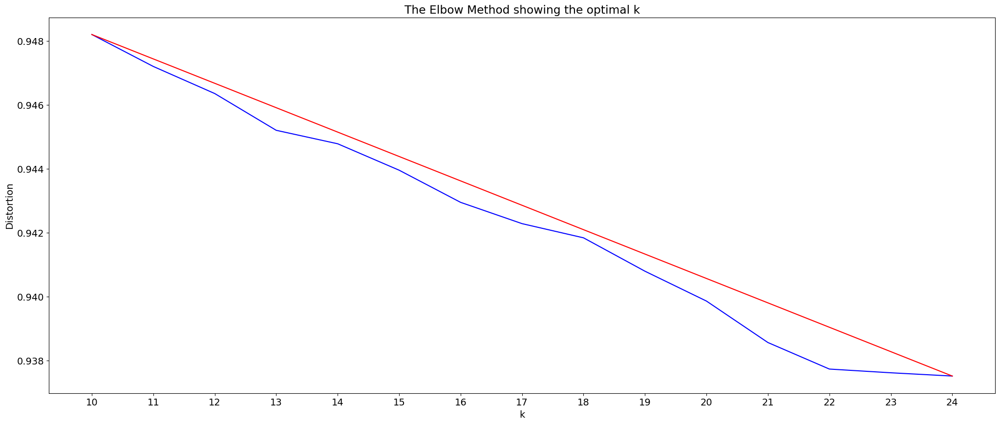

In [23]:
# run kmeans with many different values of k
distortions = []
K = range(10, 25)

for k in tqdm(K):
    k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced)
    k_means.fit(X_reduced)
    distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# Plot the elbow curve to find optimal value of k
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xticks(range(10, 25))
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Looking at the graph, it is safe to say that k=13 looks like a good choice as there is a definite elbow present at k=13. For our case, we will choose 13 as our optimal number of clusters while performing clustering on the abstract texts.

In [24]:
k = 13

kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced)
plot_df['cluster'] = y_pred

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Next we need to visualize the clusters that are generated by K-means. However, the current dimension of the vectors is huge and we cannot visualize anything with a dimension higher than 3. So, for proper visualization of the clusters, we will reduce the dimensions such that we can plot the results in a 2D graph. For this, we use t-SNE. t-SNE will attempt to preserve the relations of the higher dimensional data as closely as possible when shrunk to 2D.

In [25]:
tsne = TSNE(verbose=1, perplexity=40) 
X_embedded = tsne.fit_transform(X.toarray())

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9840 samples in 0.036s...
[t-SNE] Computed neighbors for 9840 samples in 4.038s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9840
[t-SNE] Computed conditional probabilities for sample 2000 / 9840
[t-SNE] Computed conditional probabilities for sample 3000 / 9840
[t-SNE] Computed conditional probabilities for sample 4000 / 9840
[t-SNE] Computed conditional probabilities for sample 5000 / 9840
[t-SNE] Computed conditional probabilities for sample 6000 / 9840
[t-SNE] Computed conditional probabilities for sample 7000 / 9840
[t-SNE] Computed conditional probabilities for sample 8000 / 9840
[t-SNE] Computed conditional probabilities for sample 9000 / 9840
[t-SNE] Computed conditional probabilities for sample 9840 / 9840
[t-SNE] Mean sigma: 0.409966
[t-SNE] KL divergence after 250 iterations with early exaggeration: 126.905075
[t-SNE] KL divergence after 1000 iterations: 3.961309


/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


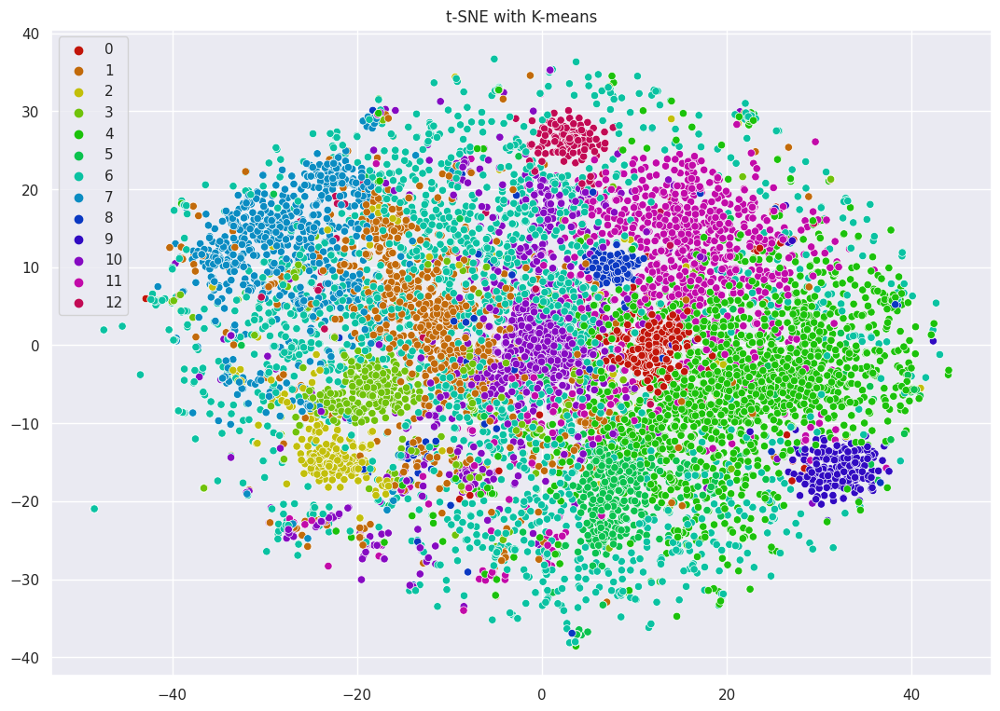

In [26]:
# sns settings
sns.set(rc={'figure.figsize':(13,9)})

# colors
palette = sns.hls_palette(k, l=.4, s=.9)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('t-SNE with K-means')
plt.show()

Each of the marker in the plot above signifies a document and the colour the marker represents the cluster it belongs to. K-means puts the document vectors with close euclidean distance near to each other. We can see that in most cases, documents of the same cluster are very closely grouped with each other. 

### Plotting wordclouds for all the generated clusters from K-means

In [27]:
# import all libraries necessary to generate and plot wordclouds
import random
from textwrap import wrap
from wordcloud import WordCloud

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


For each of the clusters generated by K-means, we will generate a word cloud. The size of the words or terms increases with the frequency of the word in texts. That means the most frequently occuring words will have a larger size as compared to the words which occur sparsely.

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


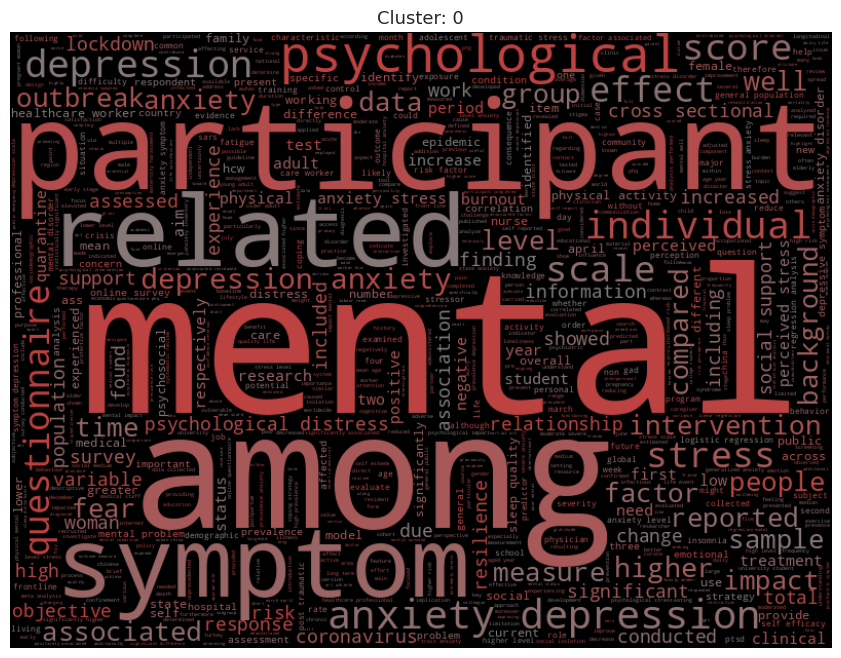

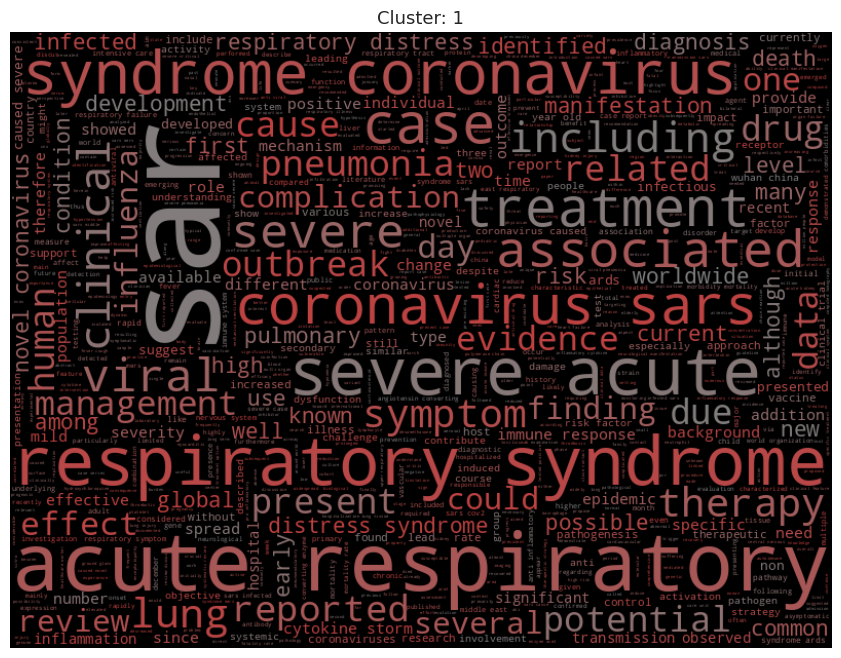

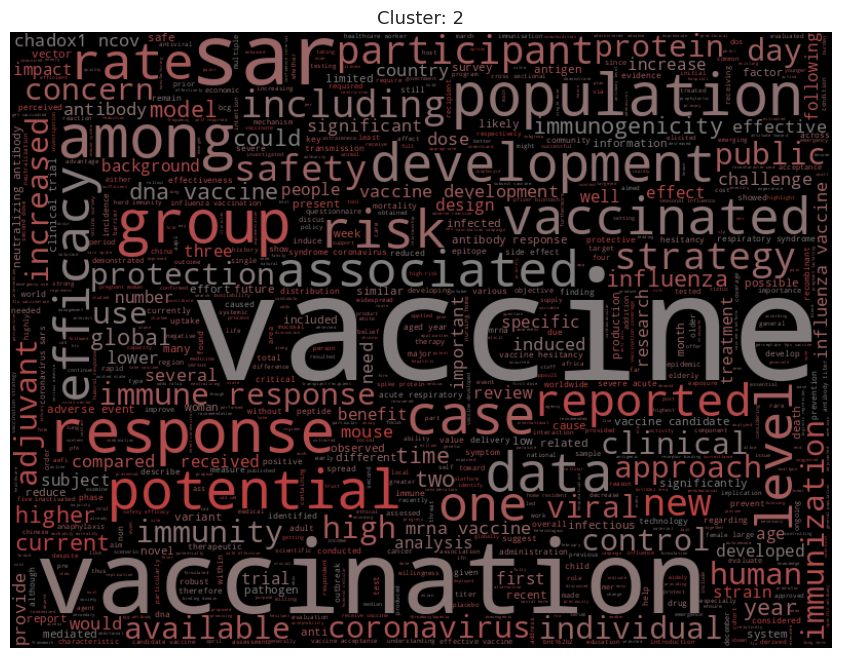

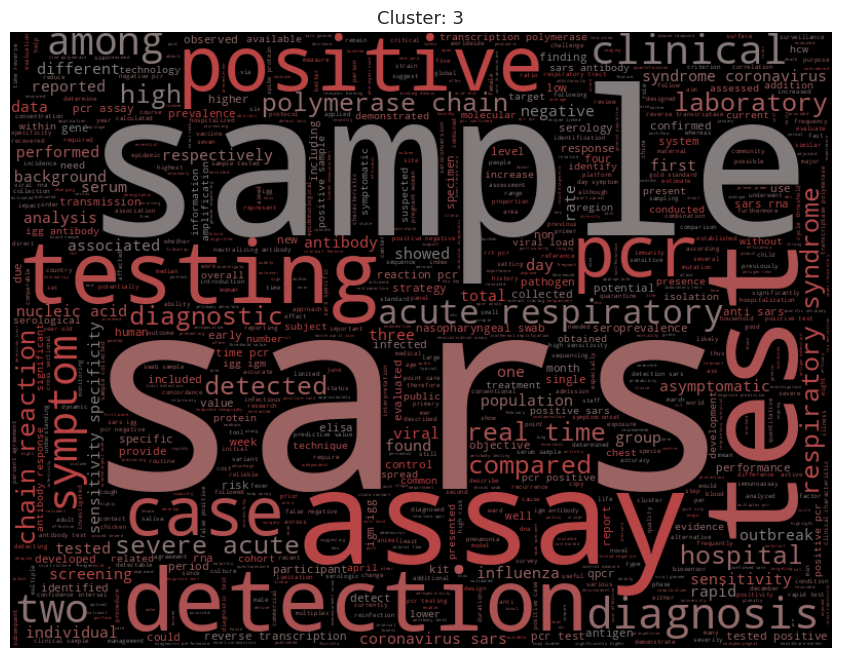

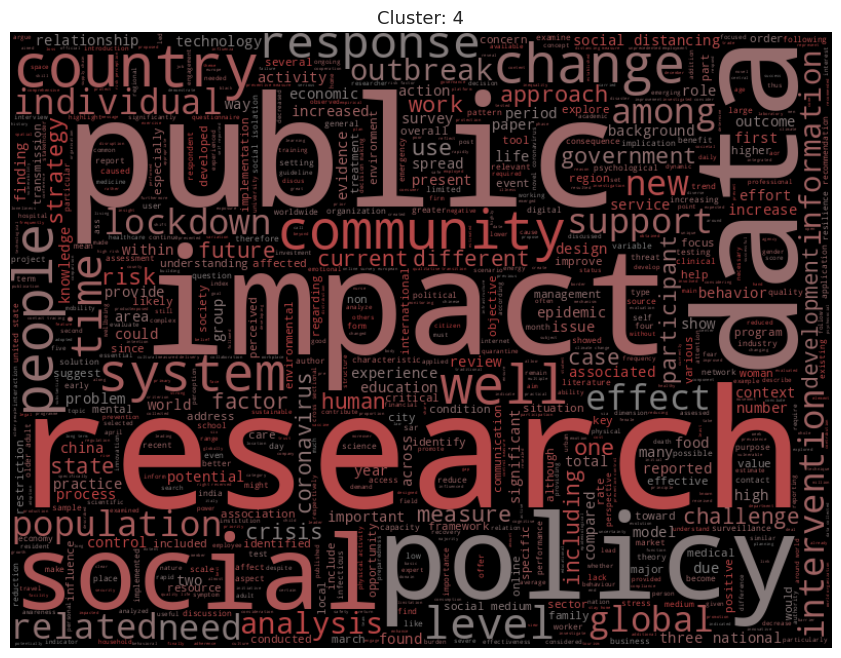

...

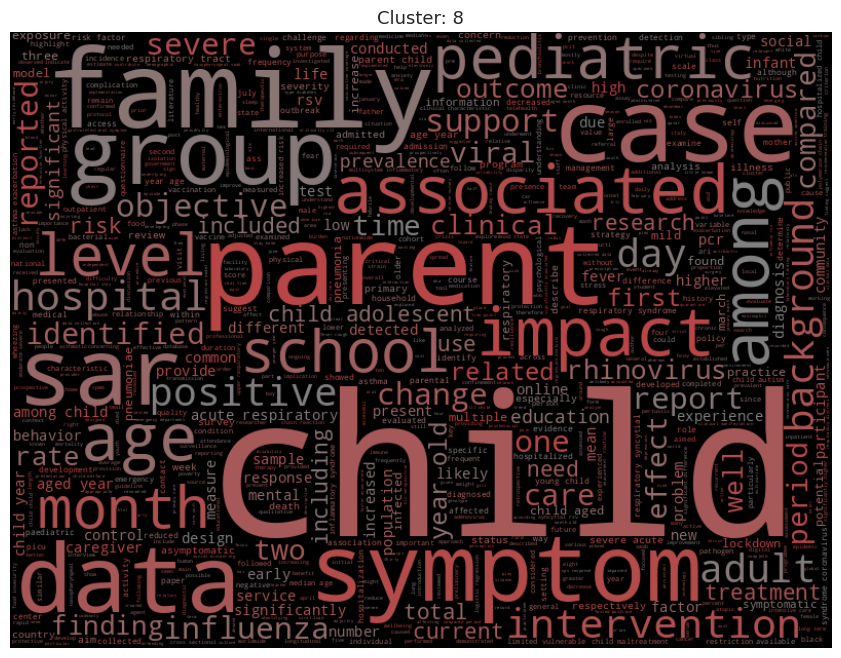

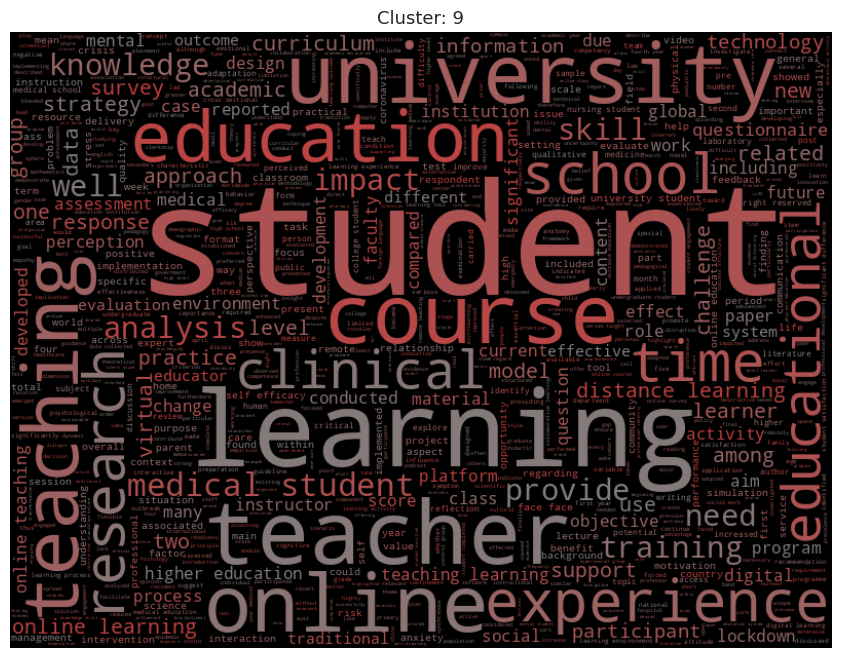

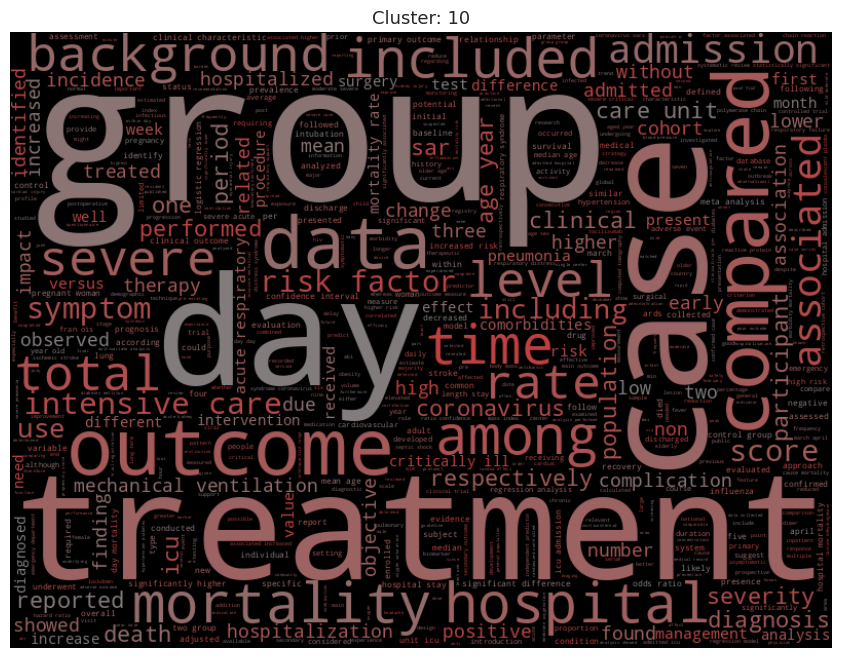

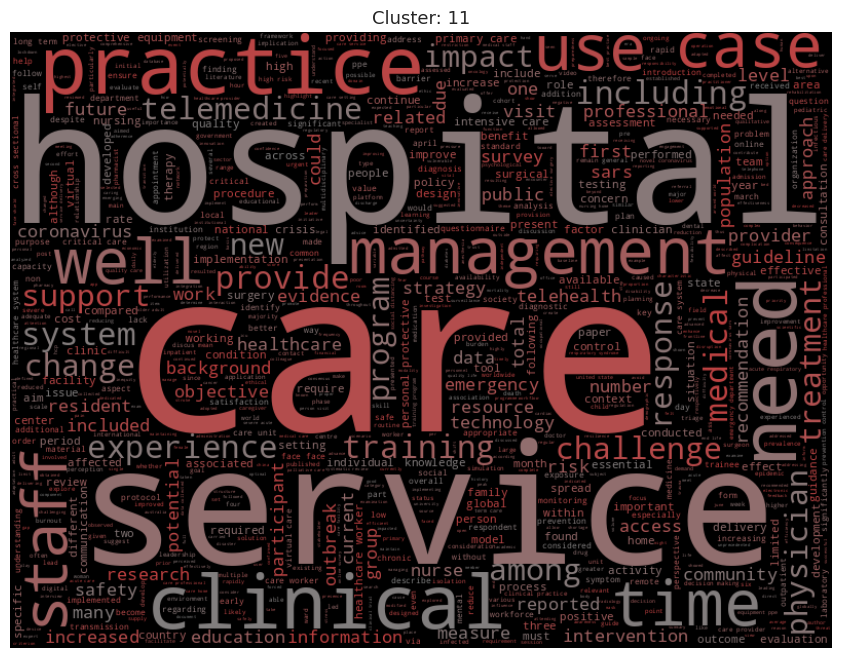

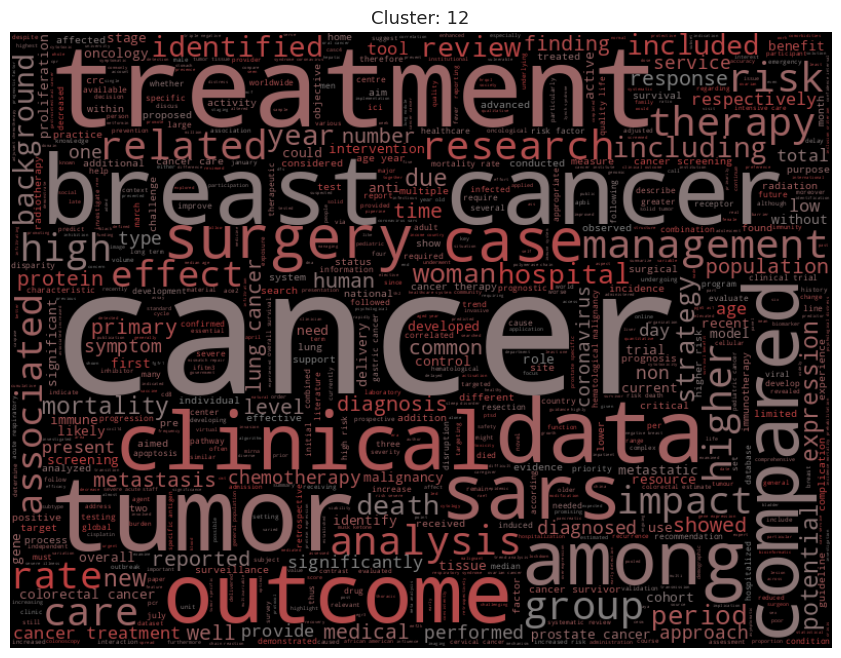

In [28]:
# Function to set color scheme for the wordclouds
def color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, {}%, 50%)".format(random.randint(0, 50))


# Function for generating word clouds
def generate_wordcloud(data, cluster):
    wc = WordCloud(background_color="black", max_words=2000, stopwords=stopwords, width=800, height=600)
    wc.generate(" ".join(data))
    wc.recolor(color_func=color_func, random_state=42)
    plt.figure(figsize=(15,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap('Cluster: ' + str(cluster),60)), fontsize=13)
    plt.show()

    
# Plotting word cloud for each cluster
for i in range(0, k):
    word_data = plot_df[plot_df['cluster'] == i]['col'].values
    generate_wordcloud(word_data, i)

### Performing Text Modelling using Latent Discriminant Analysis (LDA) and visualizing using pyLDAvis

In [12]:
# import gensim and pyLDAvis for LDA topic modelling and visualization
import gensim
import gensim.corpora as corpora
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim.models.coherencemodel import CoherenceModel

import pyLDAvis
from pyLDAvis import gensim_models

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


Next we will perform topic modelling to generate topics from our data and also visualize the topic modelling. We will use Latent Discrminant Analysis (LDA) to perform topic modelling.

Bigrams are two words frequently occurring together in the document. Trigrams are 3 words frequently occurring. Gensim’s Phrases model can build and implement the bigrams, trigrams, quadgrams and more. The two important arguments to Phrases are min_count and threshold. The higher the values of these param, the harder it is for words to be combined to bigrams.

In [13]:
data_words = plot_df['tokenized_col'].values

# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['background', 'workforce', 'often', 'identify', 'burnout', 'nursing', 'outcome', 'burnout', 'constitutes', 'factor', 'contribute', 'development', 'wider', 'consequence', 'individual', 'organisation', 'rarely', 'made', 'explicit', 'aimed', 'provide', 'comprehensive', 'summary', 'research', 'examines', 'theorised', 'relationship', 'burnout', 'variable', 'order', 'determine', 'known', 'known', 'cause', 'consequence', 'burnout', 'nursing', 'relates', 'theory', 'burnout', 'searched_medline', 'cinahl', 'psycinfo', 'included', 'quantitative', 'primary', 'empirical', 'published_english', 'examined', 'association', 'burnout', 'work', 'related', 'factor', 'nursing_workforce', 'ninety', 'one', 'paper', 'identified', 'majority', 'cross_sectional', 'three', 'subscales', 'maslach_burnout_inventory', 'mbi', 'scale', 'measure', 'burnout', 'hypothesised', 'maslach', 'identified', 'high', 'workload', 'value', 'incongruence', 'low', 'control', 'job', 'low', 'decision', 'latitude', 'poor', 'social', 'cli

The two main inputs to the LDA topic model are the dictionary(id2word) and the corpus. We will create them first.

In [14]:
# Create Dictionary
id2word = corpora.Dictionary(data_words)

# Create Corpus
texts = data_words

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[[(0, 2), (1, 2), (2, 1), (3, 1), (4, 1), (5, 1), (6, 2), (7, 1), (8, 1), (9, 15), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 3), (19, 1), (20, 1), (21, 1), (22, 2), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 3), (39, 1), (40, 1), (41, 2), (42, 2), (43, 3), (44, 1), (45, 4), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 5), (56, 2), (57, 1), (58, 1), (59, 1), (60, 1), (61, 2), (62, 2), (63, 1), (64, 9), (65, 1), (66, 1), (67, 4), (68, 2), (69, 1), (70, 1), (71, 1), (72, 3), (73, 1), (74, 2), (75, 6), (76, 1), (77, 1), (78, 1), (79, 1), (80, 2), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 5), (88, 1), (89, 2), (90, 1), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 5), (103, 1), (104, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 1), (110, 1

Gensim creates a unique id for each word in the document. The produced corpus shown above is a mapping of (word_id, word_frequency). For example, (0, 2) above implies, word id 0 occurs twice in the first document. Likewise, word id 2 occurs once and so on.

This is used as the input by the LDA model. If we want to see what word a given id corresponds to, we can pass the id as a key to the dictionary.

In [30]:
id2word[0]

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'absence'

We have everything required to train the LDA model. In addition to the corpus and dictionary, we need to provide the number of topics as well. For this, we will need to find the optimal value for number of topics.

Generally, **topic coherence** provides a convenient measure to judge how good a given topic model is. Our approach to finding the optimal number of topics here is to build many LDA models with different values of number of topics (k) and pick the one that gives the highest coherence value.

Choosing a ‘k’ that marks the end of a rapid growth of topic coherence usually offers meaningful and interpretable topics. Picking an even higher value can sometimes provide more granular sub-topics.

In [33]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in tqdm(range(start, limit, step)):
        model = gensim.models.LdaModel(corpus=corpus, num_topics=num_topics, id2word=id2word, 
                                       random_state=42, update_every=1, passes=10, alpha='auto', 
                                       per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, 
                                                        texts=data_words, start=2, limit=30, step=4)

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 7/7 [08:51<00:00, 75.94s/it]


/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


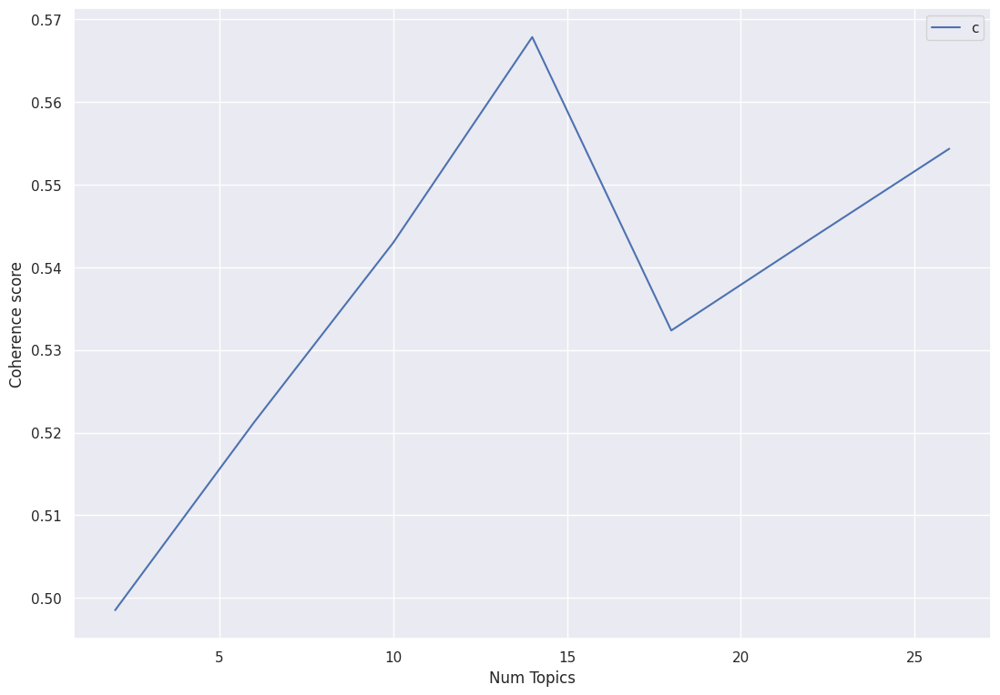

In [34]:
# Show graph
limit = 30 
start = 2
step = 4

x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [35]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.4985
Num Topics = 6  has Coherence Value of 0.5213
Num Topics = 10  has Coherence Value of 0.543
Num Topics = 14  has Coherence Value of 0.5678
Num Topics = 18  has Coherence Value of 0.5323
Num Topics = 22  has Coherence Value of 0.5434
Num Topics = 26  has Coherence Value of 0.5543


/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


With the coherence score seems to keep increasing with the number of topics, it may make better sense to pick the model that gave the highest CV before flattening out or a major drop. In this case, we pick K=14.

In [36]:
optimal_model = model_list[3]

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Now that the LDA model is built, the next step is to examine the produced topics and the associated keywords. We can use pyLDAvis package’s interactive chart for this. It is designed to work well with jupyter notebooks.

In [37]:
pyLDAvis.enable_notebook()
vis = gensim_models.prepare(optimal_model, corpus, id2word)
vis

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.099634 -0.180921       1        1  17.388760
8     -0.041712  0.052753       2        1  13.603608
0     -0.133390 -0.062517       3        1  12.320064
5     -0.197229  0.137087       4        1  11.565620
6     -0.166872 -0.058448       5        1  10.698926
3     -0.140625  0.078779       6        1   7.276636
12    -0.103117  0.098207       7        1   6.624641
1     -0.053044  0.085644       8        1   5.629782
11     0.041855 -0.202495       9        1   5.580009
13     0.066672 -0.168705      10        1   2.541898
9      0.149795  0.098395      11        1   1.969580
2      0.230308 -0.136627      12        1   1.750104
4      0.208633  0.214676      13        1   1.584575
10     0.238361  0.044174      14        1   1.465798, topic_info=             Term         Freq        Total Category  logprob  loglift
172          sars  6337.000000  6337.000000  Default  30.0000  30.0000
272       vaccine  1884.000000  1884.000000  Default  29.0000  29.0000
471         model  2866.000000  2866.000000  Default  28.0000  28.0000
1637      student  1305.000000  1305.000000  Default  27.0000  27.0000
393   respiratory  3219.000000  3219.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
1379        tumor    91.466459   446.205221  Topic14  -5.2217   2.6380
1770     computed    72.919320   218.926474  Topic14  -5.4483   3.1234
288          data   126.043793  4250.445920  Topic14  -4.9011   0.7046
1129         lung    91.932712  1112.650830  Topic14  -5.2166   1.7293
571     diagnosis    90.753044  1237.266281  Topic14  -5.2295   1.6103

[1046 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
558        2  0.117809   000
558        3  0.701730   000
558        4  0.074271   000
558        6  0.102442   000
1031       3  0.005937   001
...      ...       ...   ...
860        9  0.001023  year
860       10  0.036143  year
860       11  0.012616  year
860       12  0.003410  year
14134     10  0.989702  zikv

[3290 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 9, 1, 6, 7, 4, 13, 2, 12, 14, 10, 3, 5, 11])

Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic. A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

If we move the cursor over one of the bubbles, the words and bars on the right-hand side will update. These words are the salient keywords that form the selected topic. We have successfully built a good looking topic model.

### Comparing results from topic modelling and text clustering.

One of the practical application of topic modeling is to determine what topic a given document is about. To find that, we find the topic number that has the highest percentage contribution in that document.

The format_topics_sentences() function below nicely aggregates this information in a presentable table.

In [68]:
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row[0], key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=plot_df['abstract'].values)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,6.0,0.6814,"participant, among, mental, anxiety, reported,...",BACKGROUND: Workforce studies often identify b...
1,1,8.0,0.9138,"sars, protein, viral, drug, human, gene, immun...",PARP14 and PARP9 play a key role in macrophage...
2,2,5.0,0.2202,"hospital, mortality, day, clinical, risk, outc...",BACKGROUND: It is still unknown whether COVID-...
3,3,7.0,0.8018,"care, service, review, need, use, research, he...","Digital trails, data collections of individual..."
4,4,8.0,0.5678,"sars, protein, viral, drug, human, gene, immun...",Coronavirus disease is a potentially deadly di...
...,...,...,...,...,...
9835,9835,7.0,0.4182,"care, service, review, need, use, research, he...",BACKGROUND The way in which different communit...
9836,9836,6.0,0.6921,"participant, among, mental, anxiety, reported,...",BACKGROUND: Child maltreatment is prevalent an...
9837,9837,7.0,0.5255,"care, service, review, need, use, research, he...",The rapidly spreading coronavirus infection (C...
9838,9838,8.0,0.3347,"sars, protein, viral, drug, human, gene, immun...",Lignin has recently attracted the attention of...


Sometimes just the topic keywords may not be enough to make sense of what a topic is about. So, to help with understanding the topic, we can find the documents a given topic has contributed to the most and infer the topic by reading that document.

In [66]:
# Group top 5 sentences under each topic
sent_topics_sorted = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorted = pd.concat([sent_topics_sorted, grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                   axis=0)

# Reset Index    
sent_topics_sorted.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorted.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
sent_topics_sorted

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.9916,"case, data, model, country, number, time, rate...",The lockdown measures implemented worldwide to...
1,1.0,0.9853,"sars, test, sample, positive, pcr, testing, de...",BACKGROUND: We compared the performance of the...
2,2.0,0.9664,"user, abstract, text, see, copyright, material...","In 1985, Restivo and Salemi presented a list o..."
3,3.0,0.9641,"respiratory, acute, case, severe, coronavirus,...",A wide spectrum of cardiovascular manifestatio...
4,4.0,0.7730,"liver, tumor, tissue, expression, rat, cancer,...",Objective: To investigate whether exosomes der...
5,5.0,0.9923,"hospital, mortality, day, clinical, risk, outc...",AIMS: In patients with coronavirus disease 201...
6,6.0,0.9892,"participant, among, mental, anxiety, reported,...",Preventive health behaviors such as hand hygie...
7,7.0,0.9886,"care, service, review, need, use, research, he...","Virtual care, the use of videoconferencing tec..."
8,8.0,0.9900,"sars, protein, viral, drug, human, gene, immun...",Coronaviruses are responsible for a significan...
9,9.0,0.7020,"vaccine, influenza, vaccination, antibody, ani...",Allergen-specific immunotherapy (AIT) is the o...


The tabular output above has 14 rows, one each for a topic. It has the topic number, the keywords, and the most representative document. The **Perc_Contribution** column is nothing but the percentage contribution of the topic in the given document.

In [116]:
df_dominant_topic['cluster'] = plot_df['cluster'].values

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Next we will see that for each topic, which are the most representative clusters?

In [110]:
grouped = df_dominant_topic.groupby(['Dominant_Topic'])['cluster'].value_counts(ascending=False, normalize=True)
next_topic = 1

print("Topic 0: ")
for i, j in zip(grouped.index, grouped.values):
    current_topic = i[0]
    if current_topic != next_topic:
        pass
    else:
        print(f"Topic {int(i[0])}: ")
        next_topic += 1
    print(f"\tCluster: {int(i[1])}: {round(j*100, 2)}%")
    print()

Topic 0: 
	Cluster: 4: 36.96%

	Cluster: 5: 21.47%

	Cluster: 6: 20.56%

	Cluster: 10: 6.34%

	Cluster: 1: 4.98%

	Cluster: 2: 2.26%

	Cluster: 3: 2.17%

	Cluster: 11: 1.9%

	Cluster: 8: 1.27%

	Cluster: 12: 1.0%

	Cluster: 0: 0.45%

	Cluster: 9: 0.45%

	Cluster: 7: 0.18%

Topic 1: 
	Cluster: 3: 63.38%

	Cluster: 6: 25.91%

	Cluster: 1: 4.28%

	Cluster: 8: 1.93%

	Cluster: 7: 1.5%

	Cluster: 10: 1.5%

	Cluster: 5: 0.43%

	Cluster: 11: 0.43%

	Cluster: 2: 0.21%

	Cluster: 4: 0.21%

	Cluster: 12: 0.21%

Topic 2: 
	Cluster: 6: 54.08%

	Cluster: 4: 23.47%

	Cluster: 5: 8.16%

	Cluster: 11: 6.12%

	Cluster: 1: 3.06%

	Cluster: 9: 2.04%

	Cluster: 2: 1.02%

	Cluster: 8: 1.02%

	Cluster: 10: 1.02%

Topic 3: 
	Cluster: 1: 47.4%

	Cluster: 6: 32.05%

	Cluster: 10: 8.29%

	Cluster: 8: 3.71%

	Cluster: 2: 3.59%

	Cluster: 3: 2.1%

	Cluster: 12: 1.11%

	Cluster: 11: 0.87%

	Cluster: 4: 0.5%

	Cluster: 0: 0.25%

	Cluster: 5: 0.12%

Topic 4: 
	Cluster: 6: 79.41%

	Cluster: 12: 11.76%

	Cluster: 7: 5

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Here we can see that 36.96% of the documents in Topic 0 belong to Cluster 4. Similarly, for Topic 1, 63.38% of the documents belong to Cluster 3. Accordingly all the distribution of the clusters with each topic is shown.

Next we will see that for each cluster, which are the most representative topics?

In [108]:
grouped = df_dominant_topic.groupby(['cluster'])['Dominant_Topic'].value_counts(ascending=False, normalize=True)
next_cluster = 1

print("Cluster 0: ")
for i, j in zip(grouped.index, grouped.values):
    current_cluster = i[0]
    if current_cluster != next_cluster:
        pass
    else:
        print(f"Cluster {i[0]}: ")
        next_cluster += 1
    print(f"\tTopic: {int(i[1])}: {round(j*100, 2)}%")
    print()

Cluster 0: 
	Topic: 6: 91.67%

	Topic: 7: 4.86%

	Topic: 0: 1.74%

	Topic: 3: 0.69%

	Topic: 5: 0.35%

	Topic: 8: 0.35%

	Topic: 11: 0.35%

Cluster 1: 
	Topic: 3: 48.6%

	Topic: 8: 25.76%

	Topic: 5: 7.99%

	Topic: 0: 6.98%

	Topic: 7: 5.96%

	Topic: 1: 2.54%

	Topic: 6: 1.27%

	Topic: 2: 0.38%

	Topic: 11: 0.25%

	Topic: 9: 0.13%

	Topic: 12: 0.13%

Cluster 2: 
	Topic: 7: 18.95%

	Topic: 8: 18.6%

	Topic: 9: 18.25%

	Topic: 6: 17.54%

	Topic: 3: 10.18%

	Topic: 0: 8.77%

	Topic: 5: 5.26%

	Topic: 12: 1.4%

	Topic: 1: 0.35%

	Topic: 2: 0.35%

	Topic: 11: 0.35%

Cluster 3: 
	Topic: 1: 66.67%

	Topic: 5: 12.39%

	Topic: 0: 5.41%

	Topic: 3: 3.83%

	Topic: 7: 3.83%

	Topic: 8: 3.83%

	Topic: 6: 3.38%

	Topic: 9: 0.45%

	Topic: 12: 0.23%

Cluster 4: 
	Topic: 7: 36.15%

	Topic: 0: 23.9%

	Topic: 6: 18.8%

	Topic: 11: 18.57%

	Topic: 2: 1.35%

	Topic: 13: 0.76%

	Topic: 3: 0.23%

	Topic: 1: 0.06%

	Topic: 5: 0.06%

	Topic: 10: 0.06%

	Topic: 12: 0.06%

Cluster 5: 
	Topic: 0: 56.43%

	Topic: 

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Here we can see that 91.67% of the documents that belong to Cluster 0 are in Topic 6. Similarly, for Cluster 12, 28.96% of the documents belong to Topic 7. Accordingly all the distribution of the topics with each cluster is shown.

In [44]:
def top_kw_clusters(cluster_id, top_n=10):
    temp_df = plot_df[plot_df['cluster'] == cluster_id]
    kws = list(pd.Series(' '.join(temp_df['col']).lower().split()).value_counts()[:top_n].index)
    return kws

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [39]:
topics_kws = list()
for i in range(14):
    print(f"Top 20 keywords in Topic {i}:")
    topic_kws = [id2word[tup[0]] for tup in optimal_model.get_topic_terms(i, 20)]
    print(topic_kws)
    topics_kws.append(topic_kws)
    print()
    print()

Top 20 keywords in Topic 0:
['case', 'data', 'model', 'country', 'number', 'time', 'rate', 'population', 'period', 'outbreak', 'spread', 'measure', 'epidemic', 'first', 'lockdown', 'public', 'risk', 'transmission', 'state', 'impact']


Top 20 keywords in Topic 1:
['sars', 'test', 'sample', 'positive', 'pcr', 'testing', 'detection', 'assay', 'respiratory', 'viral', 'antibody', 'sensitivity', 'negative', 'time', 'diagnostic', 'high', 'tested', 'reaction', 'detected', 'laboratory']


Top 20 keywords in Topic 2:
['user', 'abstract', 'text', 'see', 'copyright', 'material', 'formula', 'medium', 'version', 'author', 'content', 'supplementary', 'published', 'online', 'journal', 'original', 'tourism', 'without', 'right', 'migrant']


Top 20 keywords in Topic 3:
['respiratory', 'acute', 'case', 'severe', 'coronavirus', 'syndrome', 'treatment', 'sars', 'clinical', 'symptom', 'therapy', 'associated', 'report', 'review', 'risk', 'reported', 'cause', 'complication', 'present', 'pneumonia']


Top 20 

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [45]:
clusters_kws = list()
for i in range(k):
    print(f"Top 20 most commonly occuring words in cluster {i}:")
    cluster_kws = top_kw_clusters(i, top_n=20)
    print(cluster_kws)
    clusters_kws.append(cluster_kws)
    print()
    print()

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 most commonly occuring words in cluster 0:
['anxiety', 'depression', 'mental', 'stress', 'psychological', 'symptom', 'level', 'among', 'associated', 'participant', 'related', 'higher', 'scale', 'social', 'factor', 'risk', 'disorder', 'questionnaire', 'support', 'score']


Top 20 most commonly occuring words in cluster 1:
['sars', 'respiratory', 'coronavirus', 'severe', 'acute', 'syndrome', 'case', 'clinical', 'treatment', 'symptom', 'viral', 'associated', 'lung', 'review', 'immune', 'inflammatory', 'risk', 'system', 'caused', 'drug']


Top 20 most commonly occuring words in cluster 2:
['vaccine', 'vaccination', 'sars', 'response', 'antibody', 'influenza', 'risk', 'development', 'coronavirus', 'among', 'population', 'immune', 'level', 'group', 'year', 'dose', 'effective', 'safety', 'case', 'clinical']


Top 20 most commonly occuring words in cluster 3:
['sars', 'pcr', 'positive', 'test', 'sample', 'assay', 'antibody', 'detection', 'testing', 'respiratory', 'negative', 'time', 'cl

In [46]:
kw_clusters_df = pd.DataFrame(clusters_kws).transpose()
kw_clusters_df.columns =[f'Cluster {i}' for i in range(k)]
kw_clusters_df

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8,Cluster 9,Cluster 10,Cluster 11,Cluster 12
0,anxiety,sars,vaccine,sars,social,model,treatment,sars,child,student,group,care,cancer
1,depression,respiratory,vaccination,pcr,public,data,effect,protein,year,learning,mortality,service,treatment
2,mental,coronavirus,sars,positive,data,case,clinical,viral,respiratory,online,outcome,healthcare,tumor
3,stress,severe,response,test,research,number,case,binding,parent,teaching,risk,hospital,risk
4,psychological,acute,antibody,sample,country,time,data,gene,age,education,day,practice,breast
5,symptom,syndrome,influenza,assay,impact,network,use,ace2,among,university,hospital,medical,care
6,level,case,risk,antibody,risk,proposed,level,drug,data,teacher,clinical,clinical,clinical
7,among,clinical,development,detection,measure,epidemic,analysis,human,family,medical,case,use,data
8,associated,treatment,coronavirus,testing,analysis,learning,associated,expression,case,course,associated,system,outcome
9,participant,symptom,among,respiratory,people,image,time,receptor,clinical,school,age,need,analysis


In [48]:
kw_topics_df = pd.DataFrame(topics_kws).transpose()
kw_topics_df.columns =[f'Topic {i}' for i in range(14)]
kw_topics_df

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13
0,case,sars,user,respiratory,liver,hospital,participant,care,sars,vaccine,cancer,system,group,student
1,data,test,abstract,acute,tumor,mortality,among,service,protein,influenza,model,paper,surgery,learning
2,model,sample,text,case,tissue,day,mental,review,viral,vaccination,image,research,trial,education
3,country,positive,see,severe,expression,clinical,anxiety,need,drug,antibody,feature,global,surgical,online
4,number,pcr,copyright,coronavirus,rat,risk,reported,use,human,animal,imaging,economic,procedure,training
5,time,testing,material,syndrome,cancer,outcome,survey,research,gene,response,accuracy,food,treatment,university
6,rate,detection,formula,treatment,lung,age,child,healthcare,immune,strain,learning,human,time,school
7,population,assay,medium,sars,cat,severe,level,practice,response,pathogen,proposed,crisis,outcome,teaching
8,period,respiratory,version,clinical,mouse,associated,risk,medical,receptor,immunity,algorithm,development,performed,course
9,outbreak,viral,author,symptom,survival,group,social,system,host,vector,prediction,impact,mean,program


We can compare the two dataframes above and clearly see which clusters are very similar to which topics by looking at the keywords alone. In each of the dataframes above, each column denotes a cluster or a topic and each row denotes a keyword that belongs to that cluster/topic.